In [1]:
import os, pdb, json, numpy as np, pandas as pd, nibabel as nib, matplotlib.pyplot as plt
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 1000)
from collections import Counter

In [2]:
def plot_nifti(nifti_file, orientation='unknown'):
    ctimg = nib.load(nifti_file)
    _, _, z = ctimg.shape
    print("\n\n\n %s, total %d images, orientation is %s" % (nifti_file, z, orientation))
    plt.figure(figsize=(16,4))
    plt.subplot(141); plt.imshow(ctimg.get_fdata()[:,:,z*1//5], cmap='gray')
    plt.subplot(142); plt.imshow(ctimg.get_fdata()[:,:,z*2//5], cmap='gray')
    plt.subplot(143); plt.imshow(ctimg.get_fdata()[:,:,z*3//5], cmap='gray')
    plt.subplot(144); plt.imshow(ctimg.get_fdata()[:,:,z*4//5], cmap='gray')
    plt.show()
    plt.close()

#### A peak at Non-Contrast Images




 COVID-19/NHSX/nifti/Covid426_20200406_1_0.nii.gz, total 346 images, orientation is unknown


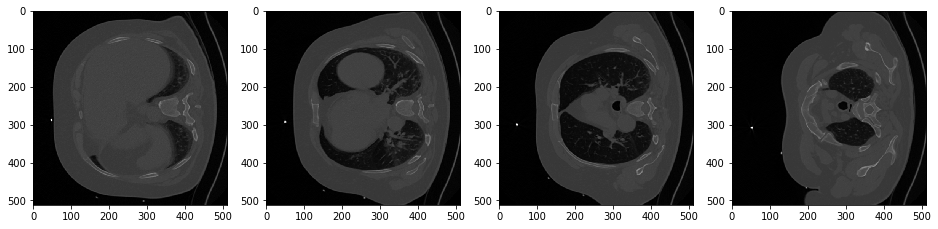

'CT Thorax'

In [3]:
patient_id = 'Covid426'
ct_id = 'Covid426_20200406_1_0'

nifti_file = os.path.join('COVID-19', 'NHSX', 'nifti', ct_id + '.nii.gz')
meta_file = os.path.join('COVID-19', 'NHSX', 'json', ct_id + '.json')
plot_nifti(nifti_file)

ctmeta = json.loads(open(meta_file).read())
ctmeta['StudyDescription']

#### A peak at Contrast Images




 COVID-19/NHSX/nifti/Covid7705_20200405_3_0.nii.gz, total 91 images, orientation is unknown


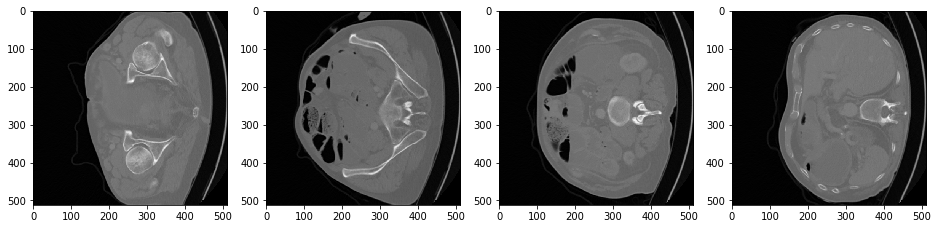

'CT Thorax abdomen pelvis with contrast'

In [4]:
patient_id = 'Covid7705'
ct_id = 'Covid7705_20200405_3_0'

nifti_file = os.path.join('COVID-19', 'NHSX', 'nifti', ct_id + '.nii.gz')
meta_file = os.path.join('COVID-19', 'NHSX', 'json', ct_id + '.json')
plot_nifti(nifti_file)

ctmeta = json.loads(open(meta_file).read())
ctmeta['StudyDescription']

#### Sanity Check on the Wuhan Data, all are supposed to be with Non-Contrast

In [3]:
img_dir = 'COVID-19/Tongji_Subset/'
os.listdir(img_dir)

['C0A_PA16_SE1.nii.gz',
 'B43_back_PA13_SE2.nii.gz',
 'B51_PA40_SE5.nii.gz',
 'C0N_PA17_SE2.nii.gz',
 'C0N_PA18_SE2.nii.gz']




 COVID-19/Tongji_Subset/C0A_PA16_SE1.nii.gz, total 32 images, orientation is unknown


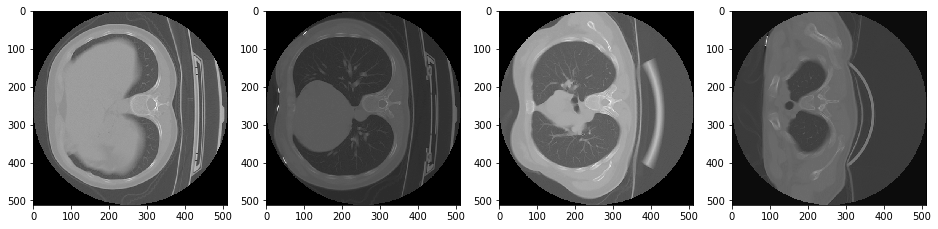

In [4]:
plot_nifti(os.path.join(img_dir, 'C0A_PA16_SE1.nii.gz'))




 COVID-19/Tongji_Subset/C0N_PA17_SE2.nii.gz, total 261 images, orientation is unknown


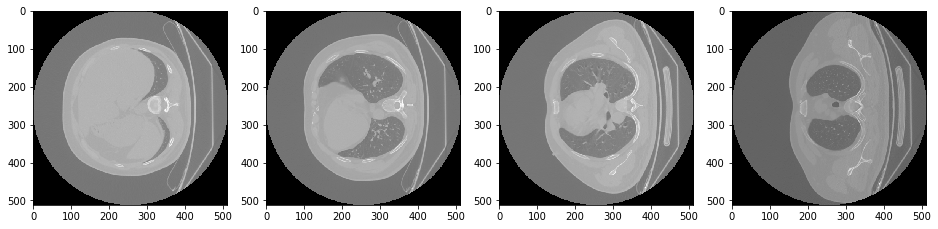

In [5]:
plot_nifti(os.path.join(img_dir, 'C0N_PA17_SE2.nii.gz'))

#### See how many CT types in the meta infos

In [6]:
all_patients = list(set([id.split('_')[0] for id in os.listdir('COVID-19/NHSX/nifti')]))
all_ct = list(set([id.split('.')[0] for id in os.listdir('COVID-19/NHSX/nifti')]))

In [10]:
ct_num, ct_info = [], []

for patient in all_patients:
    nifti_file, meta_file = [], []
    for file in os.listdir('COVID-19/NHSX/nifti'): 
        if patient in file : nifti_file.append(file) 
    for file in os.listdir('COVID-19/NHSX/json'): 
        if patient in file : 
            meta_file.append(file)
            meta = json.loads(open('COVID-19/NHSX/json/'+ file).read())
            ct_info.append(meta['StudyDescription'].lower())
#             if (meta['StudyDescription'].lower() == 'hfs') and (int(meta['AcquisitionDate'][:4]) < 2018):
    if not len(nifti_file) == len(meta_file):
        print(patient)
    ct_num.append(len(nifti_file))

Covid151
Covid5570


In [108]:
list(set(ct_info))

['ct angiogram aorta',
 'ct angio aortic aand carotid both',
 'ct thorax and abdomen and pelvis',
 'ct chest abdomen and pelvis',
 'ct abdomen/pelvis with contrast',
 'ct thorax and abdo and pelvis with contrast',
 'ct chest with contrast',
 'ct angiogram aorta, ct thorax, gated ct thorax',
 'ct angiogram pulmonary (ctpa)',
 'ct neck and thorax with contrast',
 'ct abdomen and pelvis',
 'ct angiogram pulmonary abdomen pelvis a',
 'ct cardiac angiogram coronary',
 'ct neck thorax abdomen and pelvis',
 'ct angiogram abdomen',
 'ct aorta whole',
 'ct angiogram pulmonary',
 'ct head neck thorax abdomen and pelvis',
 'ct thorax and abdomen with contrast',
 'ct angiogram pulmonary, ct abdomen and pelvis with contrast',
 'ct cardiac cor artery calcium scoring',
 'ct head',
 'ct thorax',
 'ct thorax with contrast',
 'ct neck/chest/abdo/pelvis with contrast',
 'ct abdomen and pelvis with contrast',
 'ct thorax and abdomen',
 'ct aorta whole with contrast',
 'ct chest/abdo with contrast',
 'ct c

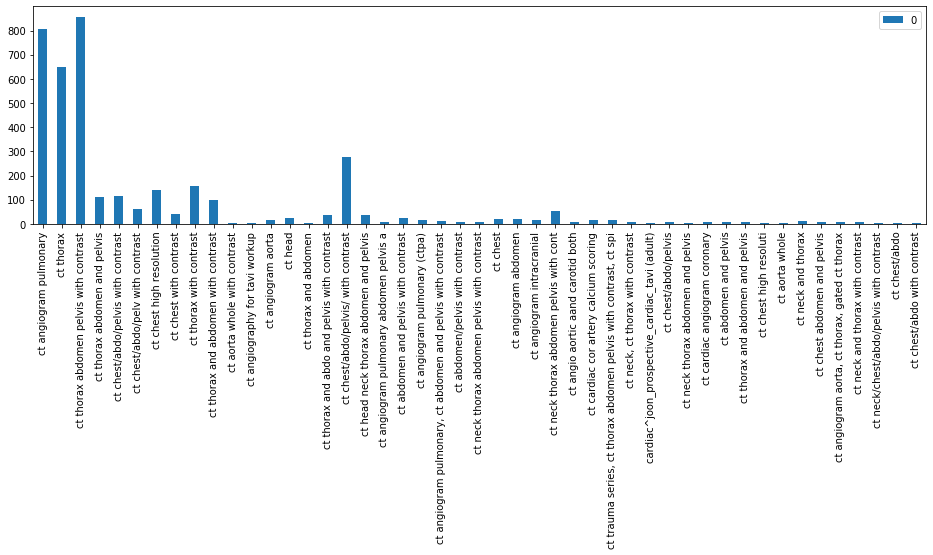

In [8]:
letter_counts = Counter(ct_info)
df = pd.DataFrame.from_dict(letter_counts, orient='index')
df.plot(kind='bar', figsize=(16,4))

#### See how many Orientations are there

In [12]:
ct_num, ct_info = [], []

sel_ct = []

for patient in all_patients:
    nifti_file, meta_file = [], []
    
    for file in os.listdir('COVID-19/NHSX/nifti'):
        if patient in file : 
            nifti_file.append(file) 
    
    for file in os.listdir('COVID-19/NHSX/json'):
        if patient in file : 
            meta_file.append(file)
            meta = json.loads(open('COVID-19/NHSX/json/'+ file).read())
            ct_info.append(meta['PatientPosition'].lower())
#             if (meta['PatientPosition'].lower() == 'hfs') and (int(meta['AcquisitionDate'][:4]) < 2018):
            if (meta['PatientPosition'].lower() == 'hfs') and (int(meta['AcquisitionDate'][:4]) < 2018):
                print(file)
                print(meta['AcquisitionDate'])
                sel_ct.append(file.replace('.json', '.nii.gz'))
#     if not len(nifti_file) == len(meta_file):
#         print(patient)
    ct_num.append(len(nifti_file))

Covid3810_20170727_2_0.json
20170727
Covid3810_20170727_3_0.json
20170727
Covid3810_20170727_1_0.json
20170727
Covid3810_20170727_0_0.json
20170727
Covid6157_20170602_3_0.json
20170602
Covid6157_20170602_0_0.json
20170602
Covid6157_20170602_1_0.json
20170602
Covid6157_20170602_2_0.json
20170602
Covid6157_20170602_4_0.json
20170602
Covid154_20171107_2_0.json
20171107
Covid154_20170925_0_0.json
20170925
Covid154_20170815_0_0.json
20170815
Covid154_20170815_1_0.json
20170815
Covid154_20170925_1_0.json
20170925
Covid154_20171107_4_0.json
20171107
Covid154_20170925_2_0.json
20170925
Covid154_20171107_3_0.json
20171107
Covid154_20170815_2_0.json
20170815
Covid154_20171107_1_0.json
20171107
Covid154_20170925_5_0.json
20170925
Covid154_20170925_3_0.json
20170925
Covid154_20170925_4_0.json
20170925
Covid154_20171107_0_0.json
20171107
Covid4007_20171104_1_0.json
20171104
Covid4007_20171104_2_0.json
20171104
Covid4007_20171104_0_0.json
20171104
Covid4007_20171104_3_0.json
20171104
Covid4007_20171

In [13]:
list(set(ct_info))

['ffs', 'ffdl', 'hfdl', 'hfp', 'hfs', 'ffp']

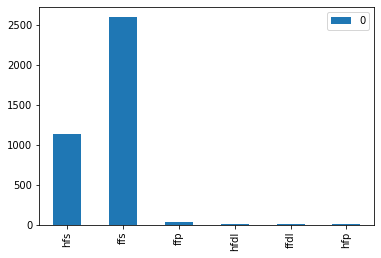

In [15]:
# plt.hist(ct_info)
letter_counts = Counter(ct_info)
df = pd.DataFrame.from_dict(letter_counts, orient='index')
df.plot(kind='bar')

#### FFP




 total has : 10 images


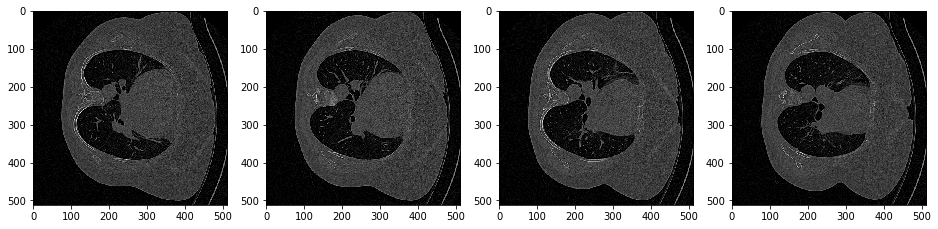




 total has : 194 images


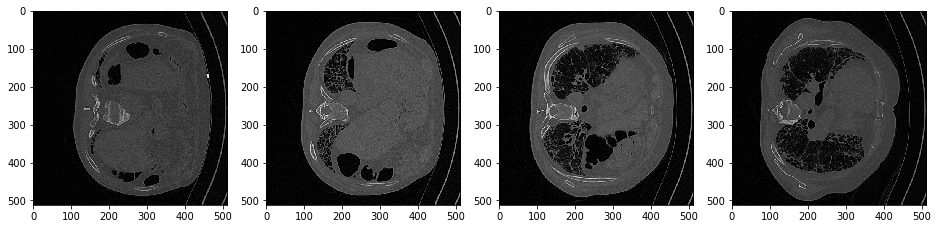

In [73]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid3261_20190405_5_0.nii.gz'))
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid3273_20200226_1_0.nii.gz'))

#### FFDL




 total has : 757 images


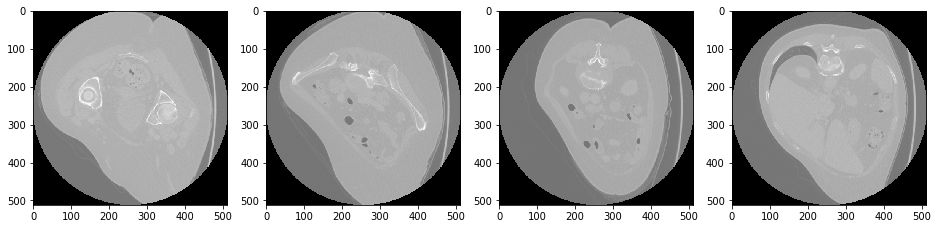




 total has : 127 images


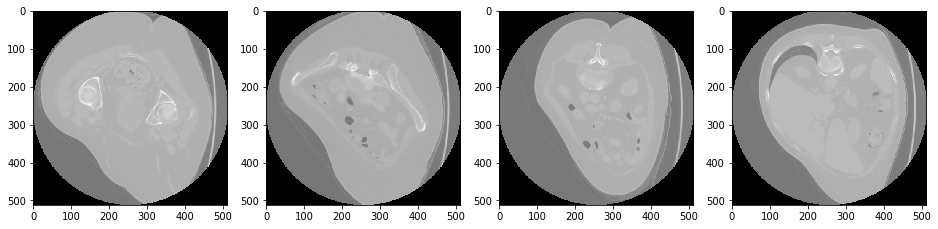

In [74]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid3236_20200428_0_0.nii.gz'))
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid3236_20200428_1_0.nii.gz'))

#### HFDL




 total has : 373 images


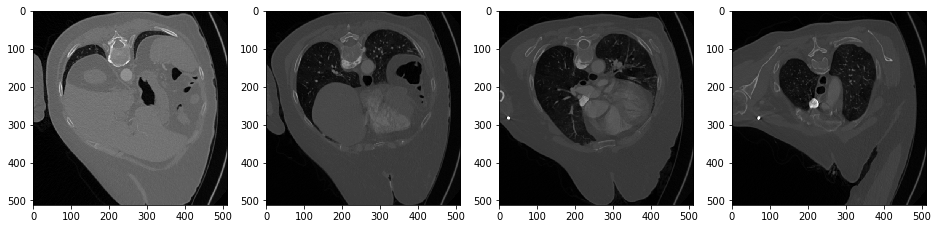

In [76]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid3236_20200330_0_0.nii.gz'))

#### HFP




 total has : 13 images


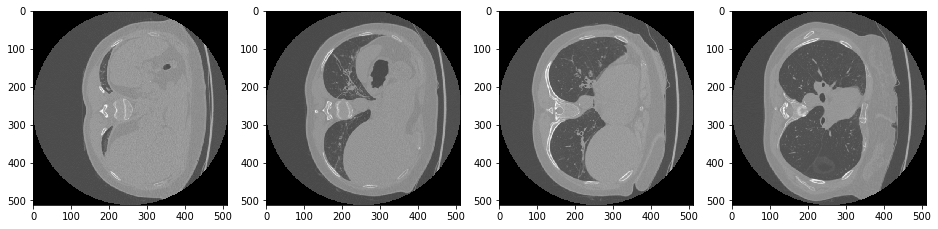

In [79]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid3838_20180731_1_0.nii.gz'))

#### hfs




 COVID-19/NHSX/nifti/Covid16655_20200416_0_0.nii.gz, total 99 images, orientation is unknown


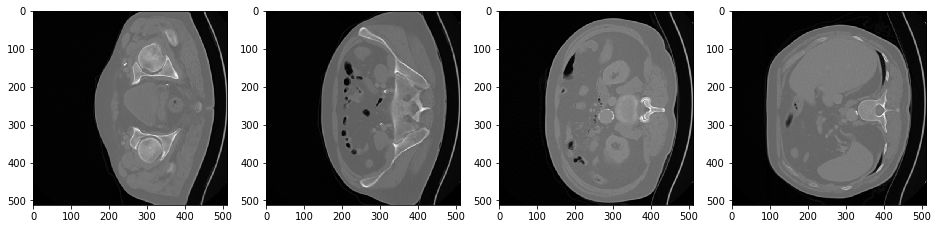




 COVID-19/NHSX/nifti/Covid308_20190321_0_0.nii.gz, total 265 images, orientation is unknown


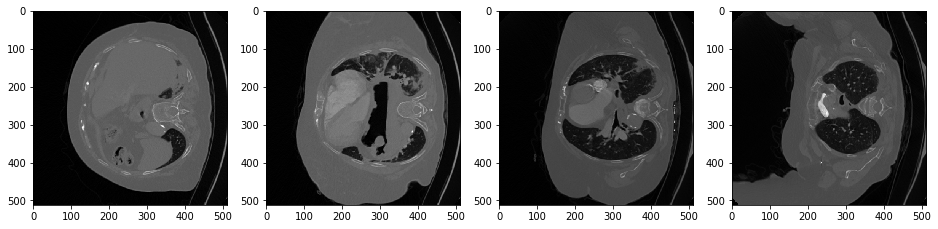




 COVID-19/NHSX/nifti/Covid223_20181002_2_0.nii.gz, total 158 images, orientation is unknown


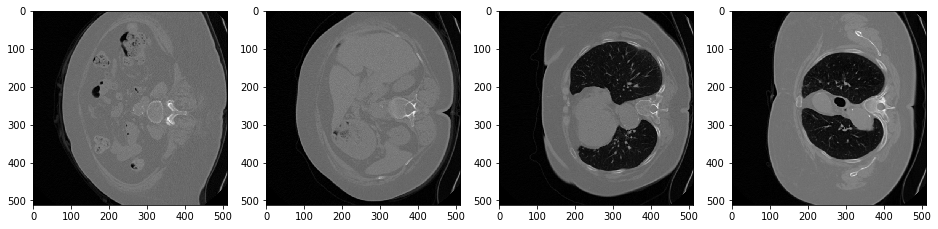

In [7]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid16655_20200416_0_0.nii.gz'))
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid308_20190321_0_0.nii.gz'))
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid223_20181002_2_0.nii.gz'))




 COVID-19/NHSX/nifti/Covid154_20170925_5_0.nii.gz, total 88 images, orientation is unknown


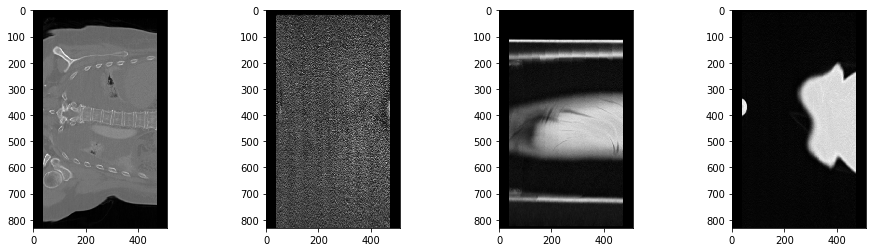

In [8]:
'''there are some are abnormal but not all'''
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid154_20170925_5_0.nii.gz'))

#### ffs




 COVID-19/NHSX/nifti/Covid4143_20190414_0_0.nii.gz, total 227 images, orientation is unknown


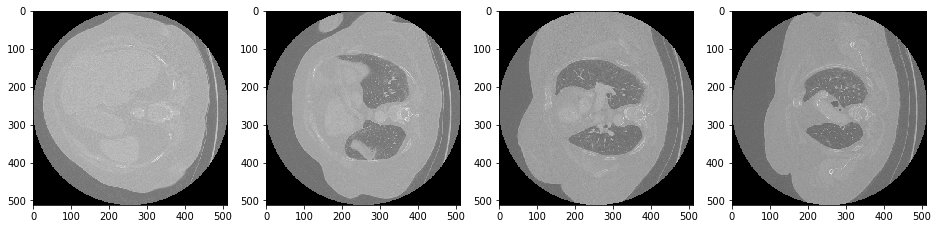




 COVID-19/NHSX/nifti/Covid16966_20200511_0_0.nii.gz, total 282 images, orientation is unknown


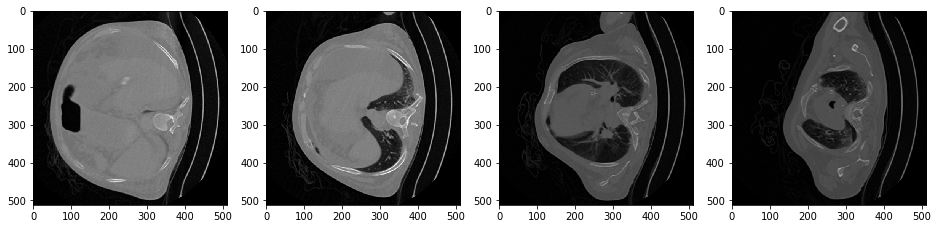

In [18]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid4143_20190414_0_0.nii.gz'))
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid16966_20200511_0_0.nii.gz'))

In [ ]:
orientation_select_map = {
    'ffp': True;
    'ffdl': False;
    'hfdl': False;
    'hfp': True;
    'hfs': True;
    'ffs': True;
}

In [19]:
xl = pd.ExcelFile('COVID-19/NHSX_Clinical_Info_Final.xlsx')
xl.sheet_names

['COVID+_Final', 'COVID-_Final']

In [20]:
ctmeta_pos = pd.read_excel('COVID-19/NHSX_Clinical_Info_Final.xlsx', header=1, sheet_name=0)
ctmeta_neg = pd.read_excel('COVID-19/NHSX_Clinical_Info_Final.xlsx', header=1, sheet_name=1)

In [21]:
ctmeta_pos.head()

,Pseudonym,SwabDate,SubmittingCentre,SwabStatus,PMH CKD,Age,CXR severity,Troponin I,"If CKD, stage",CXR severity 3,Sex,Ferritin,Duration of symptoms,Final COVID Status,Date of ITU admission,COVID CODE,WCC on admission,Current NSAID used,Creatinine on admission,Smoking status,Date of admission,Diastolic BP,1st RT-PCR result,D-dimer on admission,APACHE score on ITU arrival,PMH Lung disease,Current ACEi use,Date last known alive,COVID CODE 2,Date of death,Temperature on admission,FiO2,Lymphocyte count on admission,Date of Positive Covid Swab,Date of result of 2nd RT-PCR,PMH diabetes mellitus type II,Urea on admission,Date of result of 1st RT-PCR,Death,NEWS2 score on arrival,Date of 2nd CXR,Intubation,Fibrinogen if d-dimer not performed,PMH CVS disease,Systolic BP,Platelet count on admission,PMH hypertension,Hospital,Date of 1st CXR,Date of intubation,Date of acquisition of 2nd RT-PCR,Pack year history,Ethnicity,2nd RT-PCR result,ITU admission,PaO2,Date of acquisition of 1st RT-PCR,CRP on admission,Respiratory rate on admission,Current Angiotension receptor blocker use,Heart rate on admission,Troponin T,PMH h1pertension,PMH diabetes mellitus TYPE II,Any supplemental oxygen: FiO2,O2 saturation,PMH diabetes mellitus TYPE I
0,Covid1,NaN,Royal United Hospitals Bath NHS Foundation Trust,NaN,0,47.0,3,NaN,NaN,NaN,1,NaN,NaN,1,NaN,1,7.9,0,84,0.0,2020-11-03 00:00:00,83,0,NaN,NaN,4,0,3/13/20,NaN,NaN,37.5,NaN,1.6,2020-12-03 00:00:00,2020-12-03 00:00:00,0.0,3.3,2020-12-03 00:00:00,0,2,NaN,NaN,NaN,0,126,264,0.0,RUH Bath,2020-11-03 00:00:00,NaN,2020-11-03 00:00:00,NaN,NaN,1,NaN,96.0,2020-11-03 00:00:00,68,18,0,94,NaN,NaN,NaN,NaN,NaN,NaN
1,Covid13,NaN,Royal United Hospitals Bath NHS Foundation Trust,NaN,2,59.0,NaN,NaN,NaN,2,0,NaN,7,NaN,NaN,1,8.4,0,100,0.0,3/24/20,77,1,NaN,NaN,1,1,4/16/20,1,NaN,NaN,NaN,0.9,3/24/20,NaN,2.0,7.9,3/24/20,0,NaN,3/30/20,0,NaN,NaN,126,212,2.0,RUH Bath,3/24/20,NaN,NaN,NaN,NaN,NaN,0,NaN,3/24/20,158,23,0,NaN,23,NaN,NaN,NaN,NaN,NaN
2,Covid14,NaN,Royal United Hospitals Bath NHS Foundation Trust,NaN,2,84.0,NaN,NaN,NaN,NaN,1,NaN,3,NaN,NaN,2,9.1,0,148,3.0,3/24/20,56,1,NaN,NaN,4,1,4/16/20,NaN,NaN,36.7,NaN,0.7,3/24/20,NaN,1.0,8.2,3/24/20,0,3,NaN,0,NaN,NaN,130,180,1.0,RUH Bath,3/24/20,NaN,NaN,NaN,NaN,NaN,0,21.0,3/24/20,22,22,0,50,NaN,NaN,NaN,NaN,NaN,NaN
3,Covid145,NaN,Royal United Hospitals Bath NHS Foundation Trust,NaN,2,96.0,NaN,NaN,NaN,NaN,1,NaN,NaN,1,NaN,3,10.1,0,144,3.0,2020-06-02 00:00:00,71,1,NaN,NaN,6,2,3/23/20,0,2020-06-04 00:00:00,37.8,NaN,1,3/18/20,NaN,0.0,16.4,3/18/20,1,NaN,2/14/20,NaN,NaN,1,135,330,1.0,RUH Bath,2020-06-02 00:00:00,NaN,NaN,NaN,NaN,NaN,0,NaN,2020-06-03 00:00:00,41,18,2,96,NaN,NaN,NaN,NaN,NaN,NaN
4,Covid149,NaN,Royal United Hospitals Bath NHS Foundation Trust,NaN,0,82.0,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,1,5.2,0,172,3.0,3/24/20,69,1,NaN,NaN,0,1,4/16/20,NaN,NaN,37.4,NaN,0.4,3/24/20,NaN,1.0,12.2,3/24/20,0,NaN,NaN,0,NaN,0,121,125,0.0,RUH Bath,3/24/20,NaN,NaN,NaN,NaN,NaN,0,NaN,3/24/20,37,17,0,117,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
ctmeta_neg.head()

,Pseudonym,SwabDate,SwabDate2,SubmittingCentre,SwabStatus
0,Covid16556,2020-04-28,NaT,Cambridge University Hospitals NHS Foundation ...,0
1,Covid16557,2020-04-10,NaT,Cambridge University Hospitals NHS Foundation ...,0
2,Covid16558,2020-04-27,NaT,Cambridge University Hospitals NHS Foundation ...,0
3,Covid16559,2020-05-04,NaT,Cambridge University Hospitals NHS Foundation ...,0
4,Covid16560,2020-05-05,NaT,Cambridge University Hospitals NHS Foundation ...,0


In [23]:
patients_wo_clinical, patients_w_clinical = [], []

for patient_id in all_patients:
    if len(ctmeta_pos.loc[ctmeta_pos['Pseudonym'] == patient_id]) + \
    len(ctmeta_neg.loc[ctmeta_neg['Pseudonym'] == patient_id]) == 0:
        patients_wo_clinical.append(patient_id)
        print(patient)
    else:
        patients_w_clinical.append(patient_id)
print('total patients:', len(all_patients),
      ', with clinical records:', len(patients_w_clinical))

Covid4387
total patients: 530 , with clinical records: 529


### Confirmed Non-Contrast Cases

In [97]:
sel_ct = []

for patient in all_patients:
    for file in os.listdir('COVID-19/NHSX/json'): 
        if patient in file : 
            meta = json.loads(open('COVID-19/NHSX/json/'+ file).read())
            # if meta['StudyDescription'].lower() == 'ct thorax':
            if meta['StudyDescription'].lower() == 'ct chest with contrast':
                sel_ct.append(file)
sel_ct

['Covid5582_20200417_0_0.json',
 'Covid5582_20200417_1_0.json',
 'Covid4095_20200518_0_0.json',
 'Covid4095_20200518_1_0.json',
 'Covid5049_20200527_0_0.json',
 'Covid5049_20200527_1_0.json',
 'Covid3645_20200325_0_0.json',
 'Covid3645_20200325_1_0.json',
 'Covid4687_20200518_0_0.json',
 'Covid4687_20200518_1_0.json',
 'Covid4095_20200518_0_0.json',
 'Covid4095_20200518_1_0.json',
 'Covid4687_20200518_0_0.json',
 'Covid4687_20200518_1_0.json',
 'Covid3264_20181101_1_0.json',
 'Covid3264_20181026_1_0.json',
 'Covid3264_20181029_0_0.json',
 'Covid3264_20181101_0_0.json',
 'Covid3264_20181029_1_0.json',
 'Covid3264_20181026_0_0.json',
 'Covid3264_20181101_1_0.json',
 'Covid3264_20181026_1_0.json',
 'Covid3264_20181029_0_0.json',
 'Covid3264_20181101_0_0.json',
 'Covid3264_20181029_1_0.json',
 'Covid3264_20181026_0_0.json',
 'Covid7224_20200527_0_0.json',
 'Covid7224_20200527_1_0.json',
 'Covid5594_20190802_0_0.json',
 'Covid5594_20190802_1_0.json',
 'Covid7628_20200607_1_0.json',
 'Covid7




 COVID-19/NHSX/nifti/Covid3221_20171007_1_0.nii.gz, total 123 images, orientation is unknown


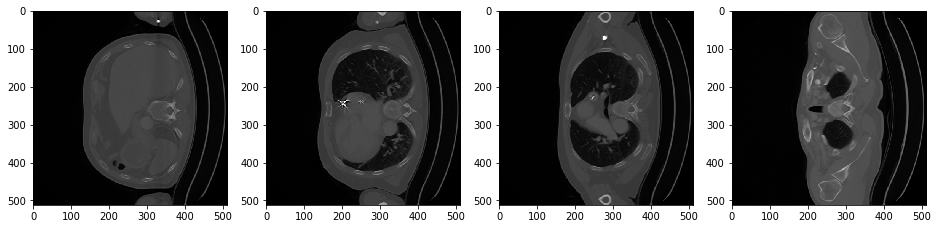

In [106]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid3221_20171007_1_0' + '.nii.gz'))

In [43]:
ct_ids = ['Covid426_20200406_1_0', 
          'Covid4789_20190616_2_0', 
          'Covid314_20200331_0_0', 
          'Covid4383_20200409_1_0', 
          'Covid4099_20200423_3_0', 
          'Covid17087_20200412_3_0', 
          'Covid3904_20200406_1_0',
          'Covid4387_20200408_0_0', 
          'Covid4345_20200409_2_0', 
          'Covid480_20200405_2_0', 
          'Covid17527_20200327_1_0', 
          'Covid4325_20200406_7_0', 
          'Covid4135_20191027_1_0', 
          'Covid16809_20200408_0_0', 
          'Covid330_20200330_2_0', 
          'Covid4362_20200408_2_0', 
          'Covid4387_20200408_1_0', 
          'Covid336_20200401_1_0', 
          'Covid3901_20200407_0_0', 
          'Covid3295_20190924_0_0', 
          'Covid17808_20200422_1_0', 
          'Covid3300_20190122_1_0', 
          'Covid16769_20200612_0_0', 
          'Covid17816_20200625_1_0', 
          'Covid17109_20181011_1_0', 
          'Covid298_20191001_2_0', 
          'Covid4237_20200404_1_0', 
          'Covid4237_20200404_3_0', 
          'Covid5049_20200527_0_0']
len(ct_ids)

28




 COVID-19/NHSX/nifti/Covid426_20200406_1_0.nii.gz, total 346 images, orientation is unknown


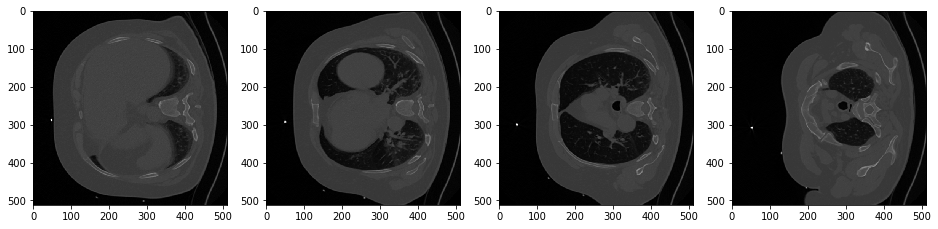




 COVID-19/NHSX/nifti/Covid4789_20190616_2_0.nii.gz, total 441 images, orientation is unknown


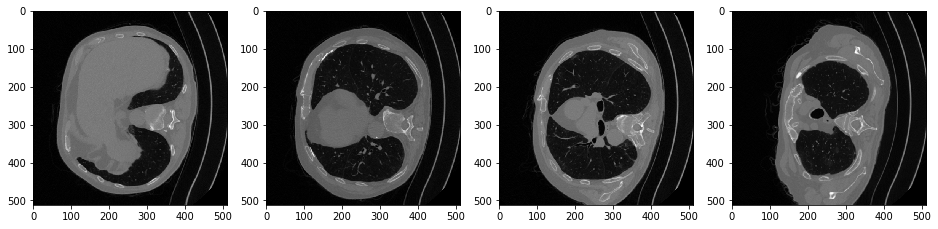




 COVID-19/NHSX/nifti/Covid314_20200331_0_0.nii.gz, total 276 images, orientation is unknown


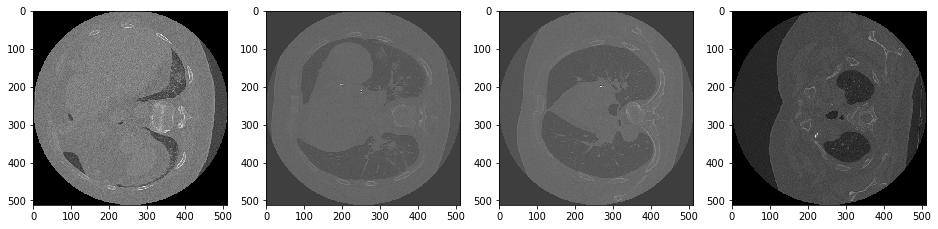




 COVID-19/NHSX/nifti/Covid4383_20200409_1_0.nii.gz, total 252 images, orientation is unknown


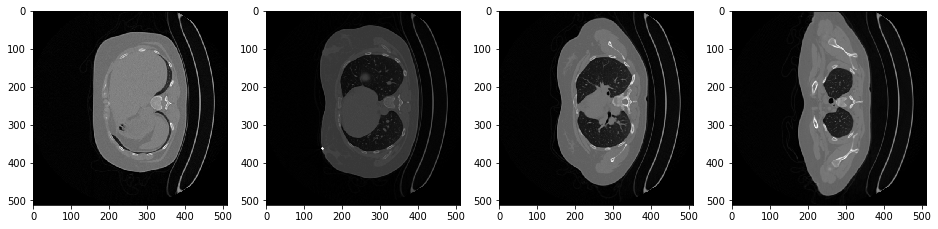




 COVID-19/NHSX/nifti/Covid4099_20200423_3_0.nii.gz, total 470 images, orientation is unknown


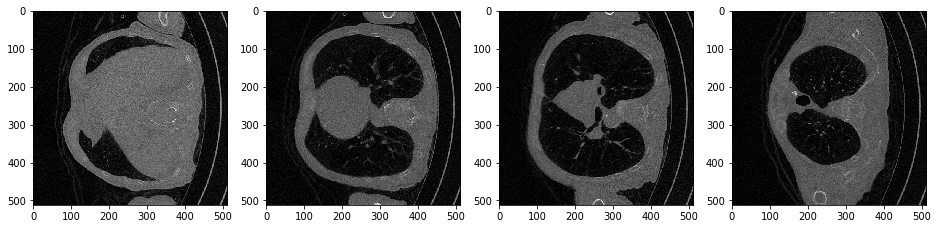




 COVID-19/NHSX/nifti/Covid17087_20200412_3_0.nii.gz, total 61 images, orientation is unknown


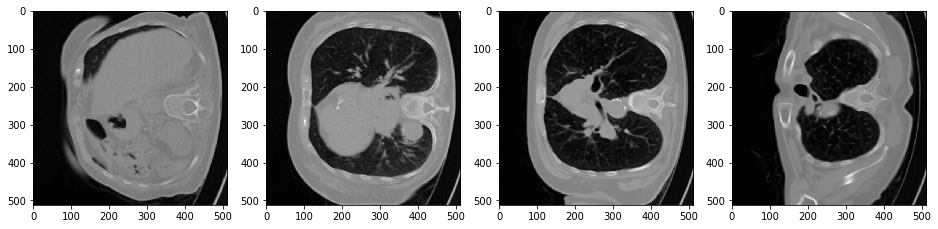




 COVID-19/NHSX/nifti/Covid3904_20200406_1_0.nii.gz, total 63 images, orientation is unknown


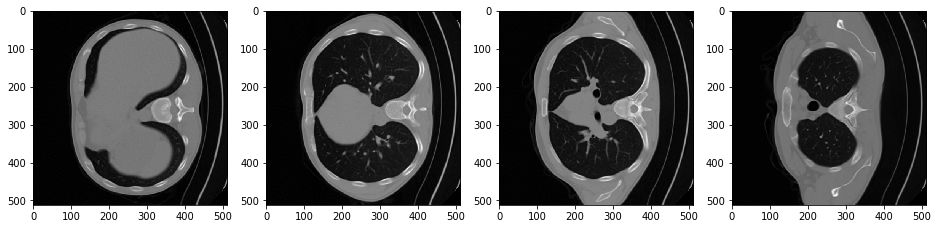




 COVID-19/NHSX/nifti/Covid4387_20200408_0_0.nii.gz, total 189 images, orientation is unknown


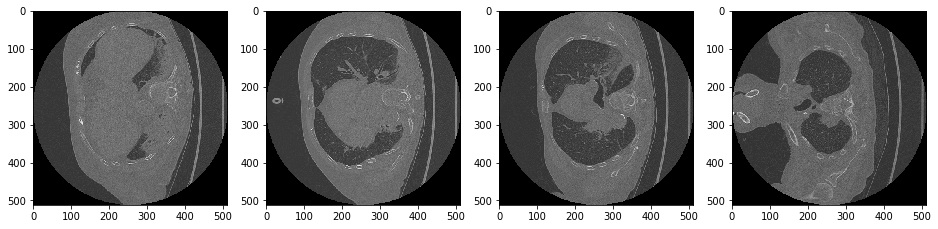




 COVID-19/NHSX/nifti/Covid4345_20200409_2_0.nii.gz, total 277 images, orientation is unknown


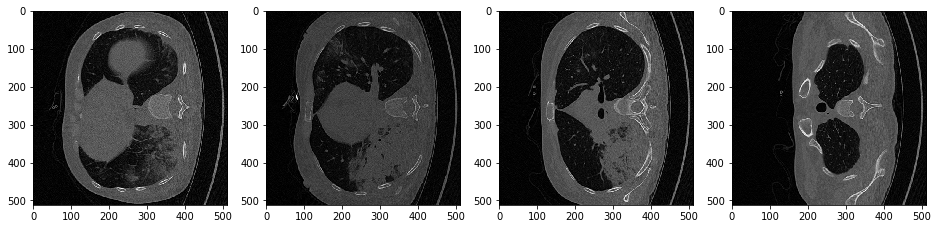




 COVID-19/NHSX/nifti/Covid480_20200405_2_0.nii.gz, total 222 images, orientation is unknown


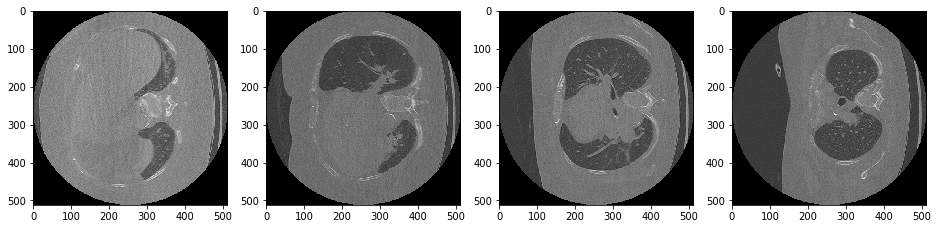




 COVID-19/NHSX/nifti/Covid17527_20200327_1_0.nii.gz, total 380 images, orientation is unknown


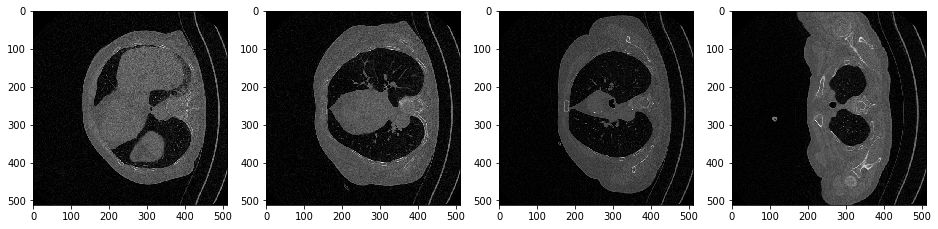




 COVID-19/NHSX/nifti/Covid4325_20200406_7_0.nii.gz, total 302 images, orientation is unknown


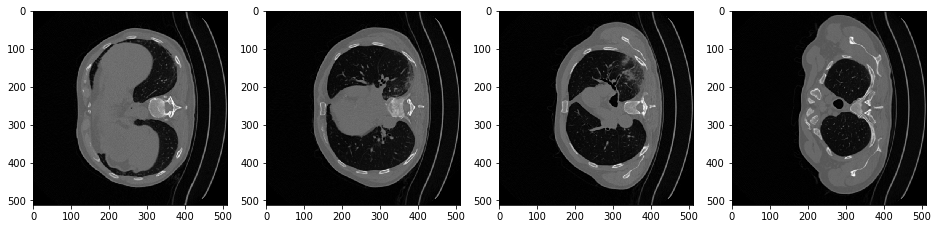




 COVID-19/NHSX/nifti/Covid4135_20191027_1_0.nii.gz, total 398 images, orientation is unknown


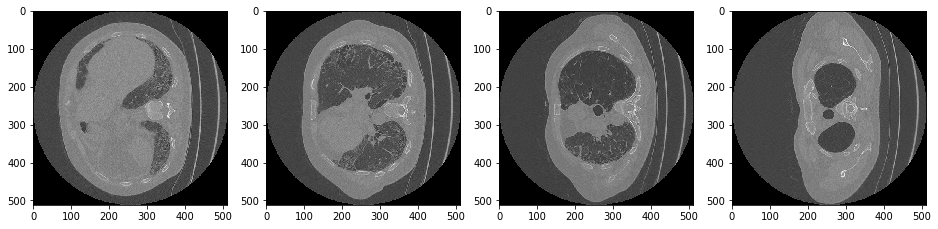




 COVID-19/NHSX/nifti/Covid16809_20200408_0_0.nii.gz, total 263 images, orientation is unknown


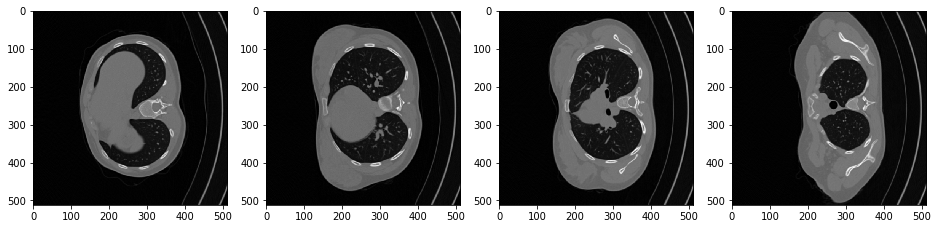




 COVID-19/NHSX/nifti/Covid330_20200330_2_0.nii.gz, total 505 images, orientation is unknown


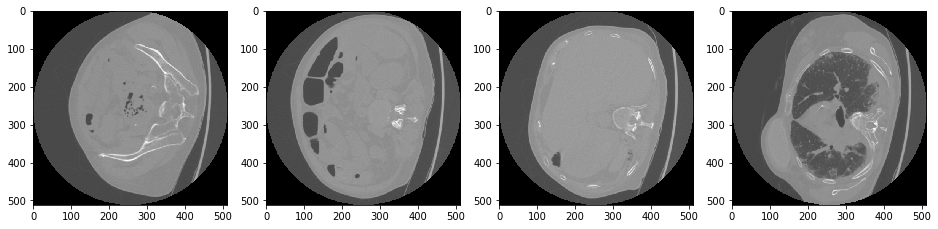




 COVID-19/NHSX/nifti/Covid4362_20200408_2_0.nii.gz, total 242 images, orientation is unknown


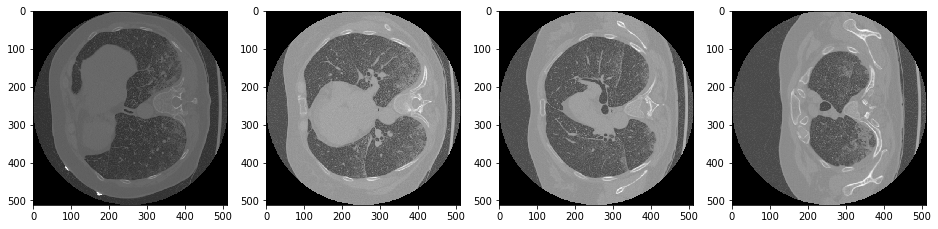




 COVID-19/NHSX/nifti/Covid4387_20200408_1_0.nii.gz, total 189 images, orientation is unknown


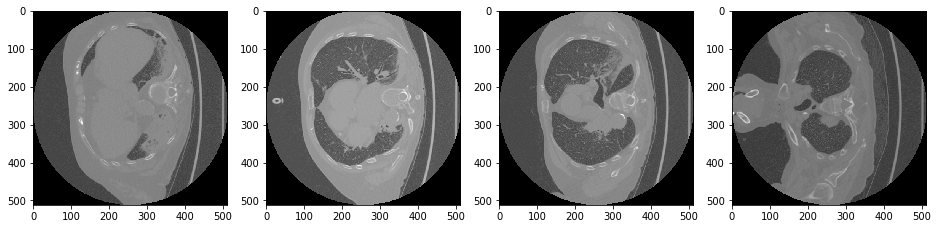




 COVID-19/NHSX/nifti/Covid336_20200401_1_0.nii.gz, total 227 images, orientation is unknown


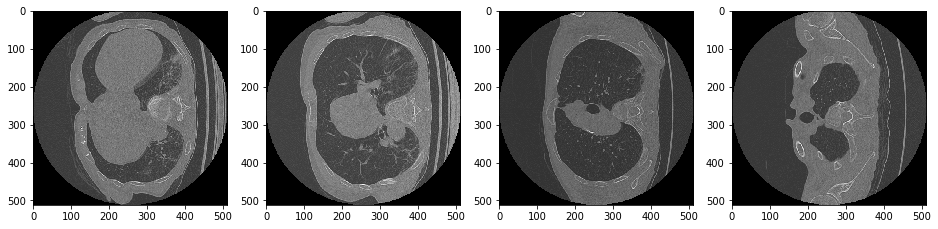




 COVID-19/NHSX/nifti/Covid3901_20200407_0_0.nii.gz, total 277 images, orientation is unknown


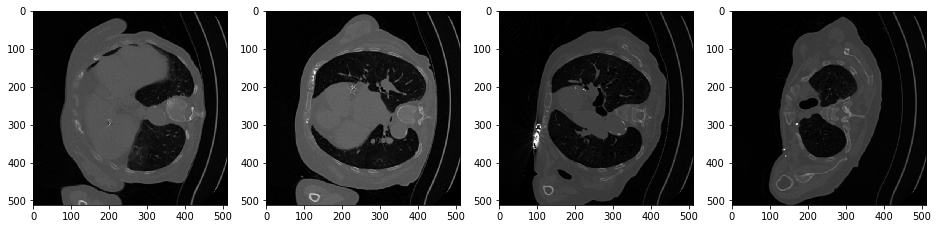




 COVID-19/NHSX/nifti/Covid3295_20190924_0_0.nii.gz, total 427 images, orientation is unknown


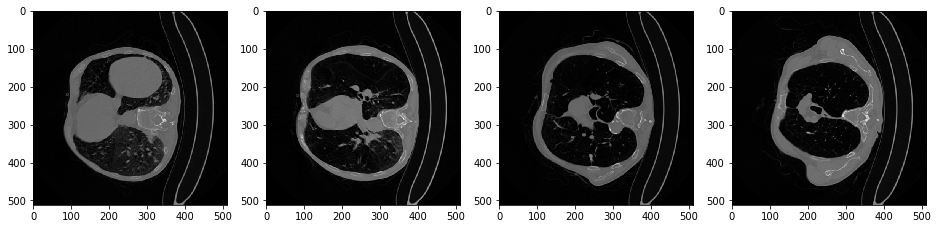




 COVID-19/NHSX/nifti/Covid17808_20200422_1_0.nii.gz, total 248 images, orientation is unknown


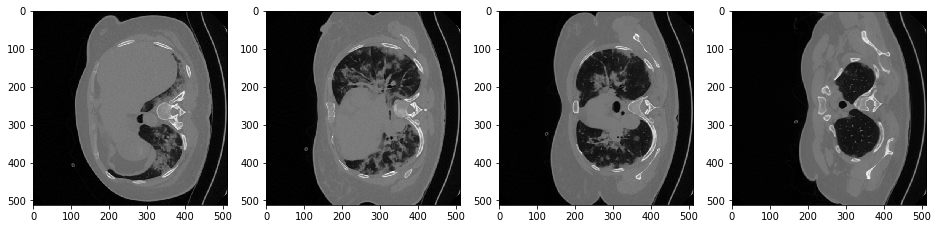




 COVID-19/NHSX/nifti/Covid3300_20190122_1_0.nii.gz, total 284 images, orientation is unknown


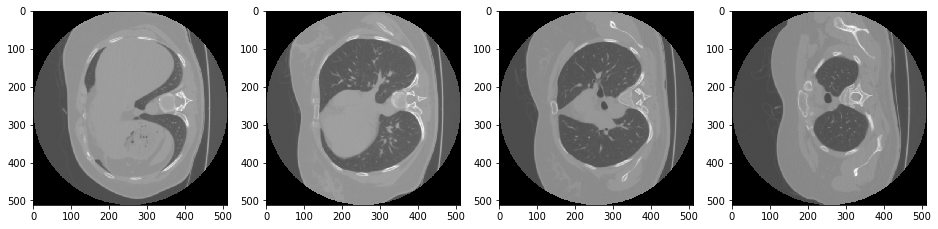




 COVID-19/NHSX/nifti/Covid16769_20200612_0_0.nii.gz, total 95 images, orientation is unknown


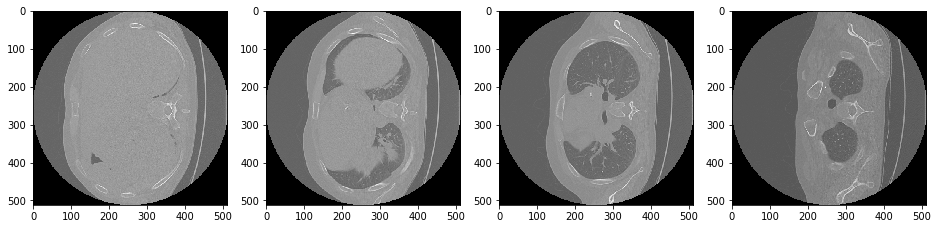




 COVID-19/NHSX/nifti/Covid17816_20200625_1_0.nii.gz, total 334 images, orientation is unknown


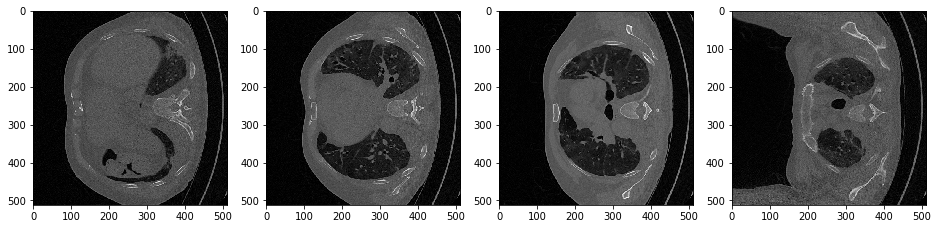




 COVID-19/NHSX/nifti/Covid17109_20181011_1_0.nii.gz, total 31 images, orientation is unknown


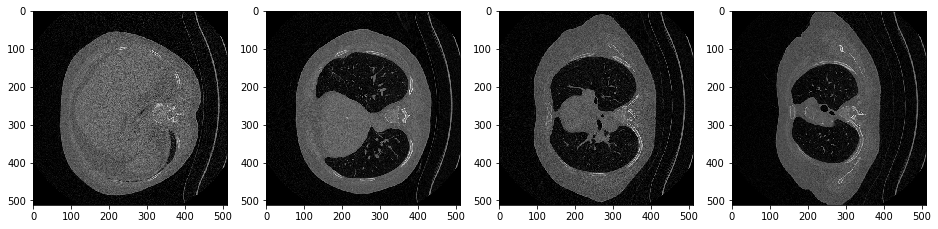




 COVID-19/NHSX/nifti/Covid298_20191001_2_0.nii.gz, total 353 images, orientation is unknown


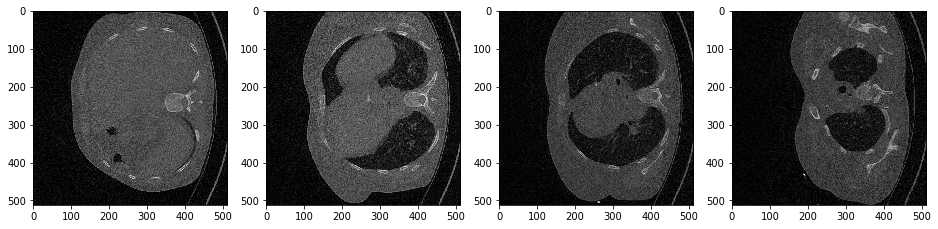




 COVID-19/NHSX/nifti/Covid4237_20200404_1_0.nii.gz, total 343 images, orientation is unknown


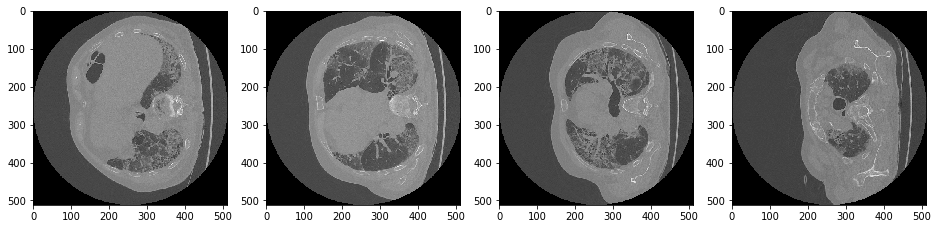




 COVID-19/NHSX/nifti/Covid4237_20200404_3_0.nii.gz, total 343 images, orientation is unknown


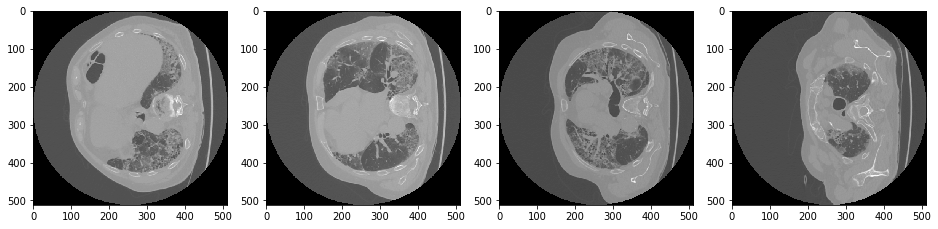

In [39]:
ct_ids = ['Covid426_20200406_1_0', 
          'Covid4789_20190616_2_0', 
          'Covid314_20200331_0_0', 
          'Covid4383_20200409_1_0', 
          'Covid4099_20200423_3_0', 
          'Covid17087_20200412_3_0', 
          'Covid3904_20200406_1_0',
          'Covid4387_20200408_0_0', 
          'Covid4345_20200409_2_0', 
          'Covid480_20200405_2_0', 
          'Covid17527_20200327_1_0', 
          'Covid4325_20200406_7_0', 
          'Covid4135_20191027_1_0', 
          'Covid16809_20200408_0_0', 
          'Covid330_20200330_2_0', 
          'Covid4362_20200408_2_0', 
          'Covid4387_20200408_1_0', 
          'Covid336_20200401_1_0', 
          'Covid3901_20200407_0_0', 
          'Covid3295_20190924_0_0', 
          'Covid17808_20200422_1_0', 
          'Covid3300_20190122_1_0', 
          'Covid16769_20200612_0_0', 
          'Covid17816_20200625_1_0', 
          'Covid17109_20181011_1_0', 
          'Covid298_20191001_2_0', 
          'Covid4237_20200404_1_0', 
          'Covid4237_20200404_3_0']

for ct in ct_ids:
    plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', ct + '.nii.gz'))

In [54]:
for nifti_file in ct_ids:
    ctimg = nib.load(os.path.join('COVID-19', 'NHSX', 'nifti', nifti_file + '.nii.gz'))
    _, _, z = ctimg.shape
    select_indices = np.random.randint(low=z//10, high=z*9//10, size=z//5)
    print("%s, total %d images, sample: %d images" % (nifti_file, z, len(select_indices)))
    train_idx, test_idx = select_indices[:len(select_indices)*9//10], select_indices[len(select_indices)*9//10:]
    img = ctimg.get_fdata()
    
    for idx in train_idx:
        plt.imsave(os.path.join("pytorch-CycleGAN-and-pix2pix-master",
                                "datasets",
                                "contrast2no_new",
                                "trainB",
                                nifti_file + "_" + str(idx) + ".jpg"),
                   img[:,:,idx])
#     print(test_idx)
    for idx in test_idx:
        plt.imsave(os.path.join("pytorch-CycleGAN-and-pix2pix-master",
                                "datasets",
                                "contrast2no_new",
                                "testB",
                                nifti_file + "_" + str(idx) + ".jpg"),
                   img[:,:,idx])

Covid426_20200406_1_0, total 346 images, sample: 69 images
Covid4789_20190616_2_0, total 441 images, sample: 88 images
Covid314_20200331_0_0, total 276 images, sample: 55 images
Covid4383_20200409_1_0, total 252 images, sample: 50 images
Covid4099_20200423_3_0, total 470 images, sample: 94 images
Covid17087_20200412_3_0, total 61 images, sample: 12 images
Covid3904_20200406_1_0, total 63 images, sample: 12 images
Covid4387_20200408_0_0, total 189 images, sample: 37 images
Covid4345_20200409_2_0, total 277 images, sample: 55 images
Covid480_20200405_2_0, total 222 images, sample: 44 images
Covid17527_20200327_1_0, total 380 images, sample: 76 images
Covid4325_20200406_7_0, total 302 images, sample: 60 images
Covid4135_20191027_1_0, total 398 images, sample: 79 images
Covid16809_20200408_0_0, total 263 images, sample: 52 images
Covid330_20200330_2_0, total 505 images, sample: 101 images
Covid4362_20200408_2_0, total 242 images, sample: 48 images
Covid4387_20200408_1_0, total 189 images, 

### Confirmed Contrast Cases

In [107]:
sel_ct = []

for patient in all_patients:
    for file in os.listdir('COVID-19/NHSX/json'): 
        if patient in file : 
            meta = json.loads(open('COVID-19/NHSX/json/'+ file).read())
            if meta['StudyDescription'].lower() == 'ct thorax and abdomen with contrast':
                sel_ct.append(file)
sel_ct

['Covid4143_20170609_1_0.json',
 'Covid4143_20170609_0_0.json',
 'Covid17569_20190517_4_0.json',
 'Covid17569_20190517_5_0.json',
 'Covid17569_20190517_3_0.json',
 'Covid17569_20190517_2_0.json',
 'Covid17569_20190517_0_0.json',
 'Covid17569_20190517_1_0.json',
 'Covid16581_20180315_3_0.json',
 'Covid16581_20180315_0_0.json',
 'Covid16581_20180315_4_0.json',
 'Covid16581_20180315_1_0.json',
 'Covid16581_20180315_6_0.json',
 'Covid16581_20180315_5_0.json',
 'Covid16581_20180315_2_0.json',
 'Covid4386_20200331_4_0.json',
 'Covid4386_20200331_1_0.json',
 'Covid4386_20200331_2_0.json',
 'Covid4386_20200331_3_0.json',
 'Covid4386_20200331_0_0.json',
 'Covid4386_20200331_5_0.json',
 'Covid4155_20200303_2_0.json',
 'Covid4755_20181130_1_0.json',
 'Covid4155_20200303_1_0.json',
 'Covid4931_20171214_2_0.json',
 'Covid4755_20181130_4_0.json',
 'Covid4386_20200331_4_0.json',
 'Covid4931_20171214_1_0.json',
 'Covid4142_20180313_0_0.json',
 'Covid4142_20180313_3_0.json',
 'Covid4386_20200331_1_0.js




 COVID-19/NHSX/nifti/Covid348_20200330_0_0.nii.gz, total 64 images, orientation is unknown


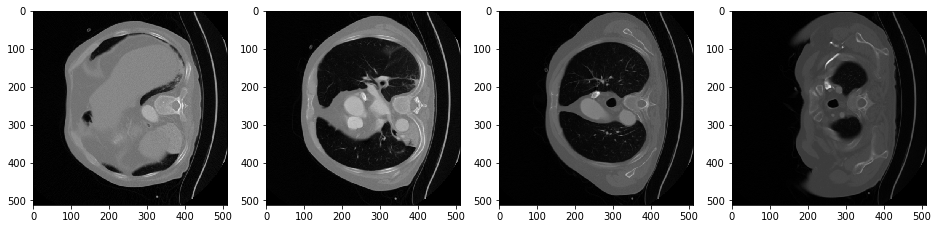

In [124]:
plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', 'Covid348_20200330_0_0' + '.nii.gz'))

In [125]:
ct_ids = ['Covid4314_20200316_1_0', 
          'Covid4152_20200210_1_0',
          'Covid16607_20200519_2_0', 
          'Covid8694_20200416_2_0', 
          'Covid308_20190321_0_0', 
          'Covid3408_20200331_0_0', 
          'Covid400_20181215_0_0', 
          'Covid4301_20200507_6_0', 
          'Covid4024_20191216_1_0', 
          'Covid400_20181215_2_0', 
          'Covid308_20190321_0_0', 
          'Covid4986_20180929_0_0', 
          'Covid320_20180215_1_0', 
          'Covid433_20170622_1_0',
          'Covid232_20180803_3_0', 
          'Covid153_20180802_3_0', 
          'Covid17056_20200408_0_0', 
          'Covid17116_20200323_1_0', 
          'Covid17574_20101126_0_0', 
          'Covid5100_20200411_0_0', 
          'Covid4931_20171214_1_0', 
          'Covid17569_20190517_3_0', 
          'Covid348_20200330_0_0']
len(ct_ids)

23




 COVID-19/NHSX/nifti/Covid4314_20200316_1_0.nii.gz, total 347 images, orientation is unknown


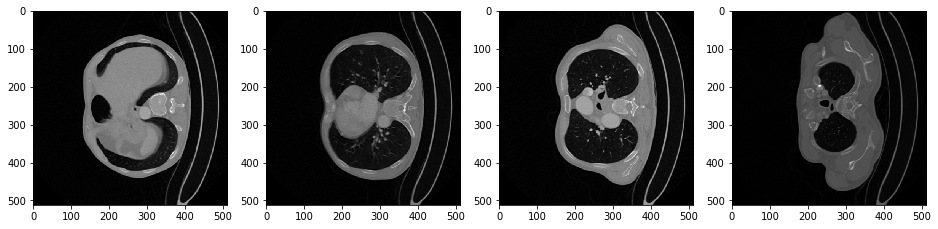




 COVID-19/NHSX/nifti/Covid4152_20200210_1_0.nii.gz, total 398 images, orientation is unknown


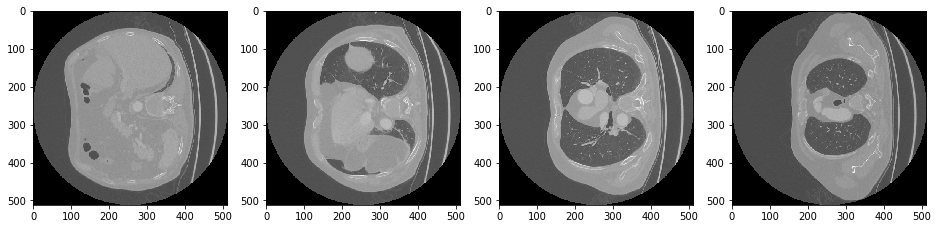




 COVID-19/NHSX/nifti/Covid16607_20200519_2_0.nii.gz, total 459 images, orientation is unknown


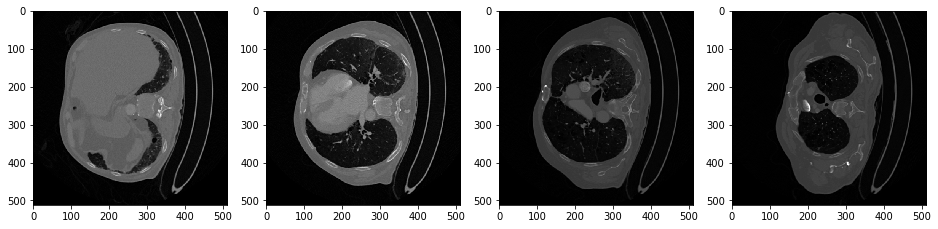




 COVID-19/NHSX/nifti/Covid8694_20200416_2_0.nii.gz, total 401 images, orientation is unknown


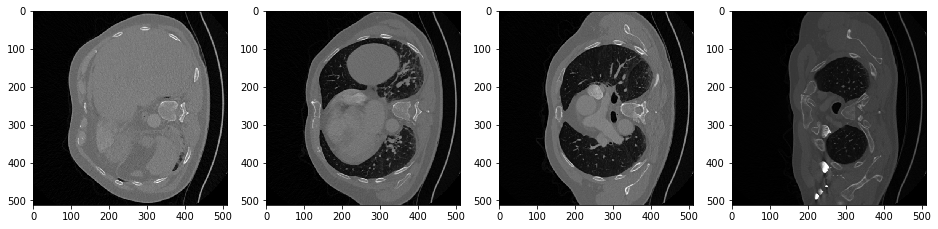




 COVID-19/NHSX/nifti/Covid308_20190321_0_0.nii.gz, total 265 images, orientation is unknown


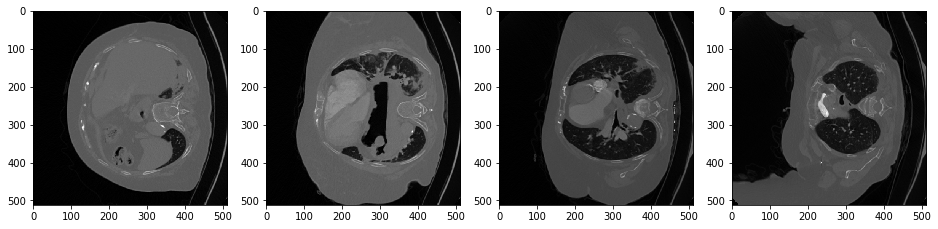




 COVID-19/NHSX/nifti/Covid3408_20200331_0_0.nii.gz, total 303 images, orientation is unknown


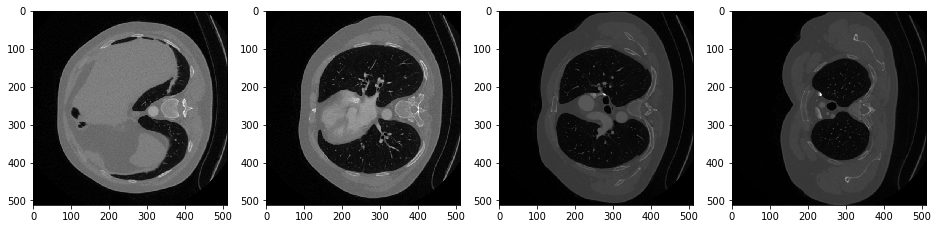




 COVID-19/NHSX/nifti/Covid400_20181215_0_0.nii.gz, total 268 images, orientation is unknown


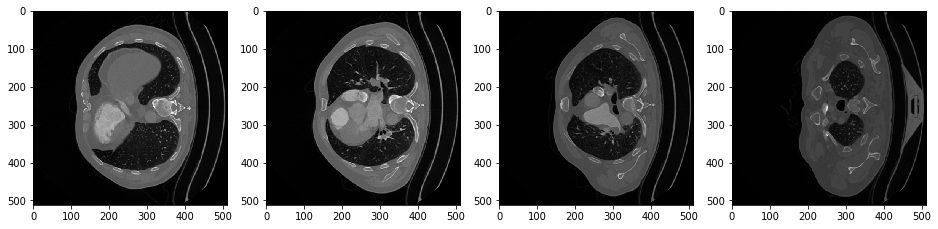




 COVID-19/NHSX/nifti/Covid4301_20200507_6_0.nii.gz, total 268 images, orientation is unknown


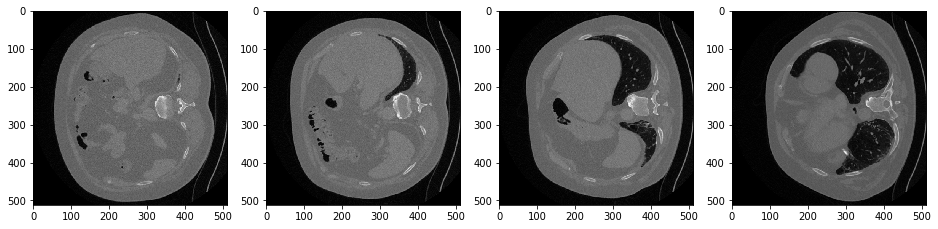




 COVID-19/NHSX/nifti/Covid4024_20191216_1_0.nii.gz, total 101 images, orientation is unknown


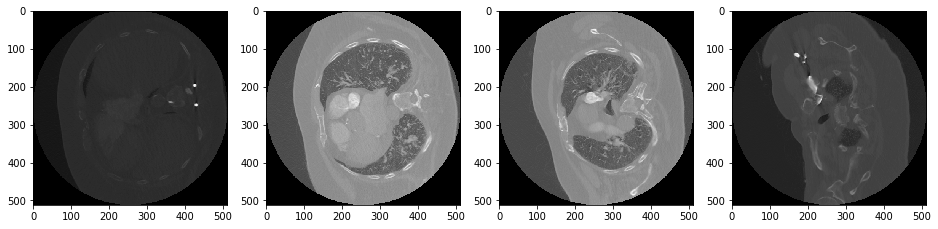




 COVID-19/NHSX/nifti/Covid400_20181215_2_0.nii.gz, total 268 images, orientation is unknown


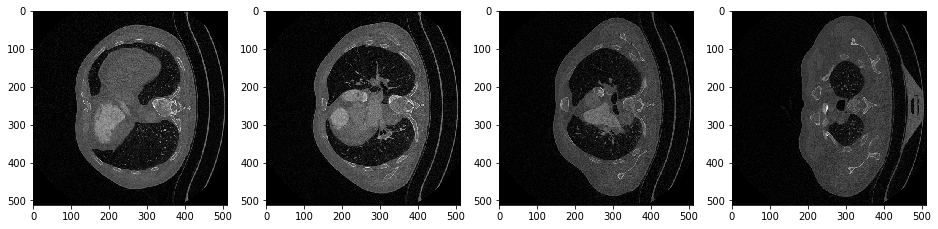




 COVID-19/NHSX/nifti/Covid308_20190321_0_0.nii.gz, total 265 images, orientation is unknown


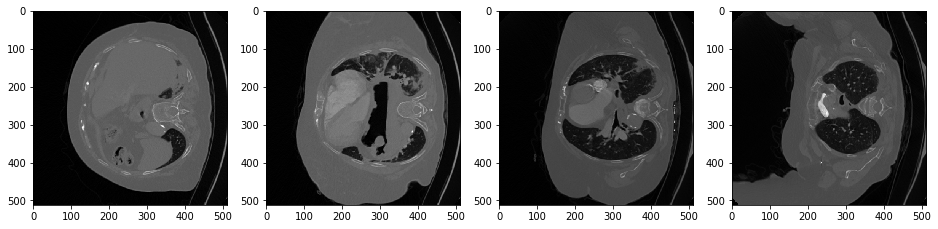




 COVID-19/NHSX/nifti/Covid4986_20180929_0_0.nii.gz, total 264 images, orientation is unknown


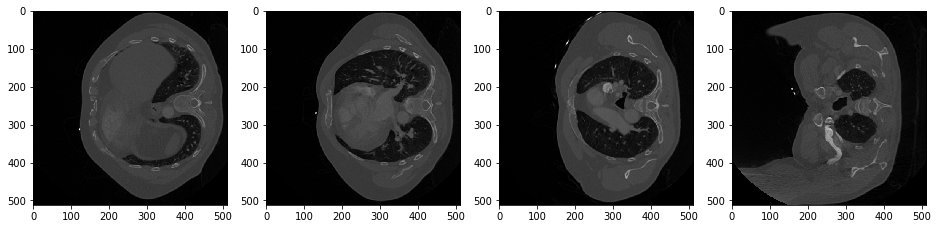




 COVID-19/NHSX/nifti/Covid320_20180215_1_0.nii.gz, total 60 images, orientation is unknown


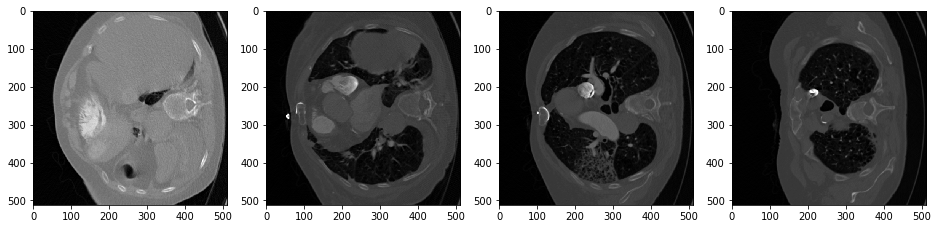




 COVID-19/NHSX/nifti/Covid433_20170622_1_0.nii.gz, total 421 images, orientation is unknown


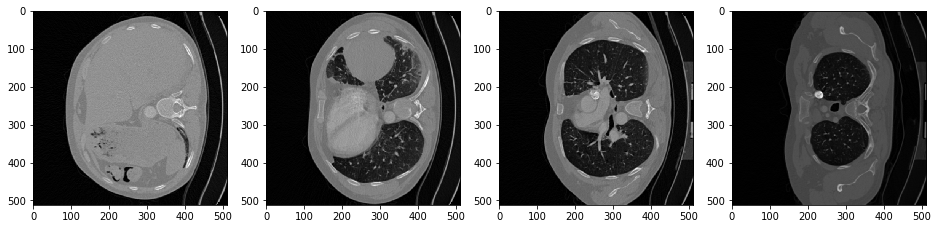




 COVID-19/NHSX/nifti/Covid232_20180803_3_0.nii.gz, total 96 images, orientation is unknown


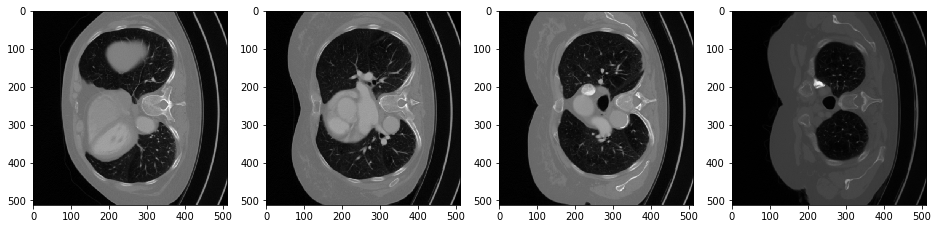




 COVID-19/NHSX/nifti/Covid153_20180802_3_0.nii.gz, total 466 images, orientation is unknown


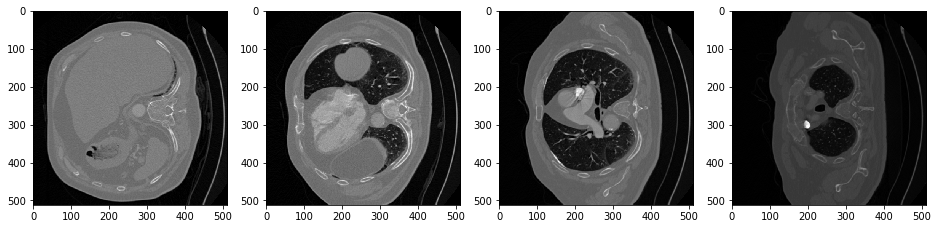




 COVID-19/NHSX/nifti/Covid17056_20200408_0_0.nii.gz, total 369 images, orientation is unknown


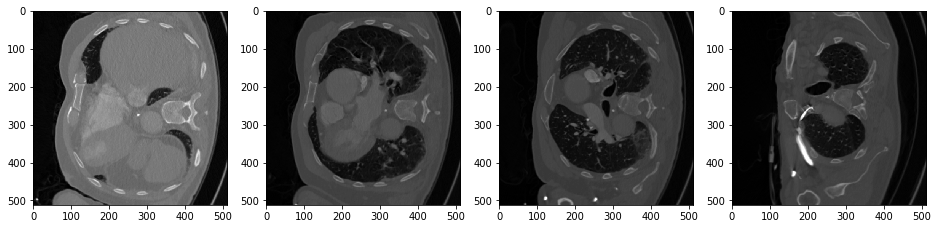




 COVID-19/NHSX/nifti/Covid17116_20200323_1_0.nii.gz, total 58 images, orientation is unknown


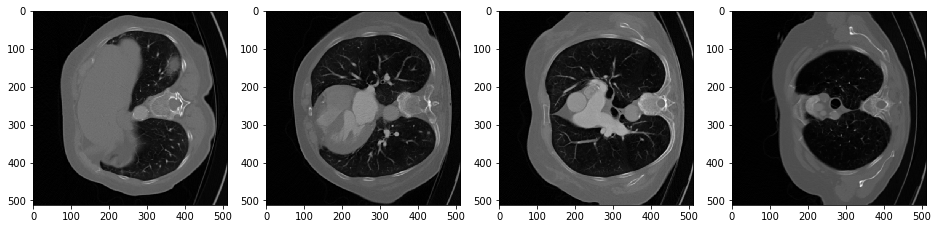




 COVID-19/NHSX/nifti/Covid17574_20101126_0_0.nii.gz, total 144 images, orientation is unknown


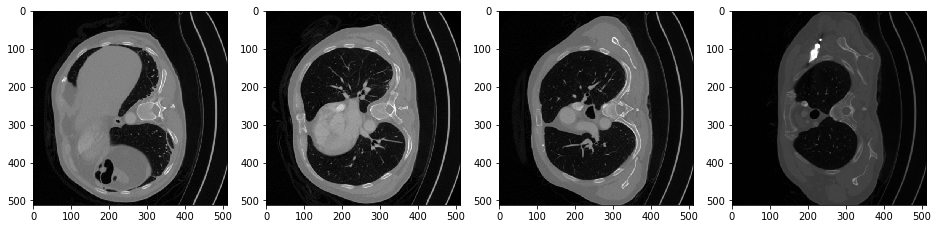




 COVID-19/NHSX/nifti/Covid5100_20200411_0_0.nii.gz, total 258 images, orientation is unknown


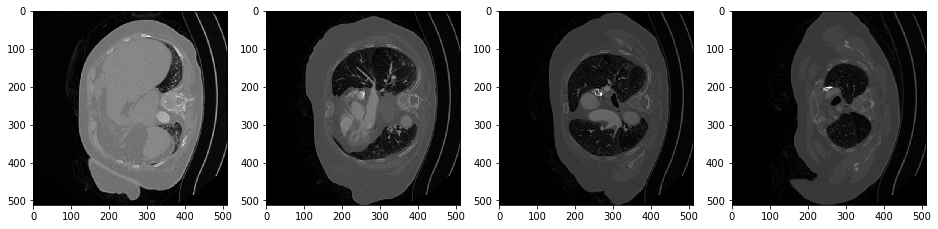




 COVID-19/NHSX/nifti/Covid4931_20171214_1_0.nii.gz, total 195 images, orientation is unknown


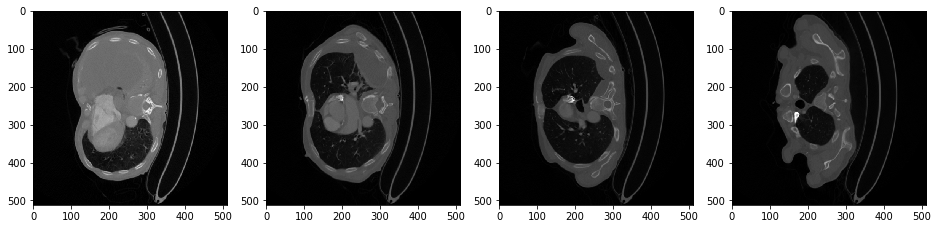




 COVID-19/NHSX/nifti/Covid17569_20190517_3_0.nii.gz, total 295 images, orientation is unknown


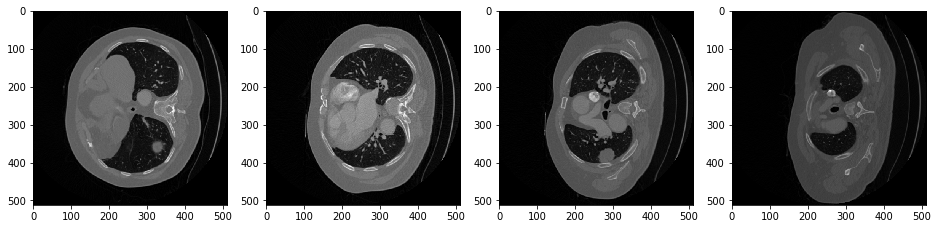




 COVID-19/NHSX/nifti/Covid348_20200330_0_0.nii.gz, total 64 images, orientation is unknown


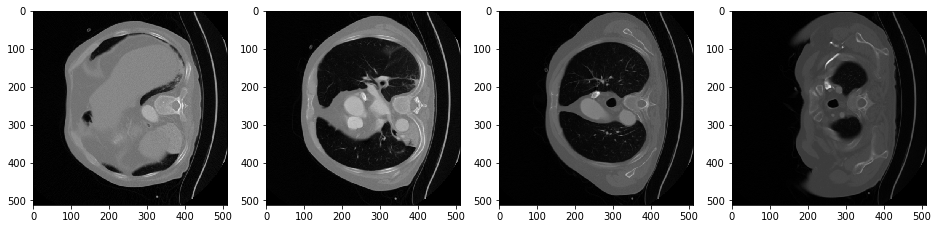

In [126]:
ct_ids = ['Covid4314_20200316_1_0', 
          'Covid4152_20200210_1_0',
          'Covid16607_20200519_2_0', 
          'Covid8694_20200416_2_0', 
          'Covid308_20190321_0_0', 
          'Covid3408_20200331_0_0', 
          'Covid400_20181215_0_0', 
          'Covid4301_20200507_6_0', 
          'Covid4024_20191216_1_0', 
          'Covid400_20181215_2_0', 
          'Covid308_20190321_0_0', 
          'Covid4986_20180929_0_0', 
          'Covid320_20180215_1_0', 
          'Covid433_20170622_1_0',
          'Covid232_20180803_3_0', 
          'Covid153_20180802_3_0', 
          'Covid17056_20200408_0_0', 
          'Covid17116_20200323_1_0', 
          'Covid17574_20101126_0_0', 
          'Covid5100_20200411_0_0', 
          'Covid4931_20171214_1_0', 
          'Covid17569_20190517_3_0', 
          'Covid348_20200330_0_0']

for ct in ct_ids:
    plot_nifti(os.path.join('COVID-19', 'NHSX', 'nifti', ct + '.nii.gz'))

In [127]:
for nifti_file in ct_ids:
    ctimg = nib.load(os.path.join('COVID-19', 'NHSX', 'nifti', nifti_file + '.nii.gz'))
    _, _, z = ctimg.shape
    select_indices = np.random.randint(low=z//5, high=z*9//10, size=z//5)
    print("%s, total %d images, sample: %d images" % (nifti_file, z, len(select_indices)))
    train_idx, test_idx = select_indices[:len(select_indices)*9//10], select_indices[len(select_indices)*9//10:]
    img = ctimg.get_fdata()
    
    for idx in train_idx:
        plt.imsave(os.path.join("pytorch-CycleGAN-and-pix2pix-master",
                                "datasets",
                                "contrast2no_new",
                                "trainA",
                                nifti_file + "_" + str(idx) + ".jpg"),
                   img[:,:,idx])
#     print(test_idx)
    for idx in test_idx:
        plt.imsave(os.path.join("pytorch-CycleGAN-and-pix2pix-master",
                                "datasets",
                                "contrast2no_new",
                                "testA",
                                nifti_file + "_" + str(idx) + ".jpg"),
                   img[:,:,idx])

Covid4314_20200316_1_0, total 347 images, sample: 69 images
Covid4152_20200210_1_0, total 398 images, sample: 79 images
Covid16607_20200519_2_0, total 459 images, sample: 91 images
Covid8694_20200416_2_0, total 401 images, sample: 80 images
Covid308_20190321_0_0, total 265 images, sample: 53 images
Covid3408_20200331_0_0, total 303 images, sample: 60 images
Covid400_20181215_0_0, total 268 images, sample: 53 images
Covid4301_20200507_6_0, total 268 images, sample: 53 images
Covid4024_20191216_1_0, total 101 images, sample: 20 images
Covid400_20181215_2_0, total 268 images, sample: 53 images
Covid308_20190321_0_0, total 265 images, sample: 53 images
Covid4986_20180929_0_0, total 264 images, sample: 52 images
Covid320_20180215_1_0, total 60 images, sample: 12 images
Covid433_20170622_1_0, total 421 images, sample: 84 images
Covid232_20180803_3_0, total 96 images, sample: 19 images
Covid153_20180802_3_0, total 466 images, sample: 93 images
Covid17056_20200408_0_0, total 369 images, sample